In [1]:
import pandas as pd
import numpy as np

df = pd.read_csv("D:\\nlp project 2\\IMDB Dataset.csv\\IMDB Dataset.csv")#mention the name of file to be extracted
df

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
...,...,...
49995,I thought this movie did a down right good job...,positive
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",negative
49997,I am a Catholic taught in parochial elementary...,negative
49998,I'm going to have to disagree with the previou...,negative


In [2]:
df['totalwords'] = df['review'].str.split().str.len() # Calculate word count

In [3]:
data = df.loc[df['totalwords'] > 5] #Removing all reviews having less than two words

In [4]:
data = data.drop('totalwords',axis = 1)

In [5]:
df = data[data['review'].map(lambda x: x.isascii())] #Removing all non-english reviews


In [6]:
df = df.dropna(how='all') # dropping blank rows

In [7]:
df

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive
...,...,...
49995,I thought this movie did a down right good job...,positive
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",negative
49997,I am a Catholic taught in parochial elementary...,negative
49998,I'm going to have to disagree with the previou...,negative


In [8]:
xx = df['review'].to_string(header=False, index=False)


In [9]:
import re


def remove_url(text):
    text = re.sub(r"http\S+", "", text)
    return text


# Example string with weird font characters plus an URL which we gonna remove.
sample =  xx

sample = remove_url(sample)
print(f"Text after removing url:- \n {sample}")

Text after removing url:- 
 One of the other reviewers has mentioned that a...
A wonderful little production. <br /><br />The ...
I thought this was a wonderful way to spend tim...
Basically there's a family where a little boy (...
Petter Mattei's "Love in the Time of Money" is ...
Probably my all-time favorite movie, a story of...
I sure would like to see a resurrection of a up...
This show was an amazing, fresh & innovative id...
Encouraged by the positive comments about this ...
If you like original gut wrenching laughter you...
Phil the Alien is one of those quirky films whe...
I saw this movie when I was about 12 when it ca...
So im not a big fan of Boll's work but then aga...
The cast played Shakespeare.<br /><br />Shakesp...
This a fantastic movie of three prisoners who b...
Kind of drawn in by the erotic scenes, only to ...
Some films just simply should not be remade. Th...
This movie made it into one of my top 10 most a...
I remember this film,it was the first film i ha...
An 

In [10]:
!pip install demoji
import demoji


def handle_emoji(string):
    emojis = demoji.findall(string)

    for emoji in emojis:
        string = string.replace(emoji, " " + emojis[emoji].split(":")[0])

    return string


print(f"Before Handling emoji:- \n {sample}")
print(f"After Handling emoji:- \n {handle_emoji(sample)}")

Before Handling emoji:- 
 One of the other reviewers has mentioned that a...
A wonderful little production. <br /><br />The ...
I thought this was a wonderful way to spend tim...
Basically there's a family where a little boy (...
Petter Mattei's "Love in the Time of Money" is ...
Probably my all-time favorite movie, a story of...
I sure would like to see a resurrection of a up...
This show was an amazing, fresh & innovative id...
Encouraged by the positive comments about this ...
If you like original gut wrenching laughter you...
Phil the Alien is one of those quirky films whe...
I saw this movie when I was about 12 when it ca...
So im not a big fan of Boll's work but then aga...
The cast played Shakespeare.<br /><br />Shakesp...
This a fantastic movie of three prisoners who b...
Kind of drawn in by the erotic scenes, only to ...
Some films just simply should not be remade. Th...
This movie made it into one of my top 10 most a...
I remember this film,it was the first film i ha...
An aw

In [11]:
def word_tokenizer(text):
    text = text.lower()
    text = text.split()

    return text


sample = sample
print(sample)
print(word_tokenizer(sample[0]))#why 0 as the data set is huge thete error that data rate limit has been reached

One of the other reviewers has mentioned that a...
A wonderful little production. <br /><br />The ...
I thought this was a wonderful way to spend tim...
Basically there's a family where a little boy (...
Petter Mattei's "Love in the Time of Money" is ...
Probably my all-time favorite movie, a story of...
I sure would like to see a resurrection of a up...
This show was an amazing, fresh & innovative id...
Encouraged by the positive comments about this ...
If you like original gut wrenching laughter you...
Phil the Alien is one of those quirky films whe...
I saw this movie when I was about 12 when it ca...
So im not a big fan of Boll's work but then aga...
The cast played Shakespeare.<br /><br />Shakesp...
This a fantastic movie of three prisoners who b...
Kind of drawn in by the erotic scenes, only to ...
Some films just simply should not be remade. Th...
This movie made it into one of my top 10 most a...
I remember this film,it was the first film i ha...
An awful film! It must have bee

In [12]:
import nltk 

from nltk.corpus import stopwords
stopwords = nltk.corpus.stopwords.words('english')

def remove_stopwords(text):
    text = [word for word in text if word not in stopwords]
    
    return text


print(f"Before removing stopwords : {word_tokenizer(sample[0])}")
print(f"After removing stopwords : {remove_stopwords(word_tokenizer(sample[0]))}")

Before removing stopwords : ['o']
After removing stopwords : []


In [13]:
def preprocessing(text):
    
    text = remove_url(text) 
    text = handle_emoji(text)
    text = text.lower() 
    text = re.sub(r'[^\w\s]', '', text)
    text = word_tokenizer(text)
    # text = stemming(text)
    text = remove_stopwords(text)
    text = " ".join(text)

    return text

In [14]:
import spacy
sp = spacy.load("en_core_web_sm")

In [15]:
from tqdm import tqdm

tqdm.pandas()

df['clean_review'] = df['review'].progress_map(preprocessing)

100%|████████████████████████████████████████████████████████████████████████████| 45339/45339 [22:12<00:00, 34.03it/s]


In [16]:
a=df['clean_review']

In [17]:
a

0        one reviewers mentioned watching 1 oz episode ...
1        wonderful little production br br filming tech...
2        thought wonderful way spend time hot summer we...
3        basically theres family little boy jake thinks...
4        petter matteis love time money visually stunni...
                               ...                        
49995    thought movie right good job wasnt creative or...
49996    bad plot bad dialogue bad acting idiotic direc...
49997    catholic taught parochial elementary schools n...
49998    im going disagree previous comment side maltin...
49999    one expects star trek movies high art fans exp...
Name: clean_review, Length: 45339, dtype: object

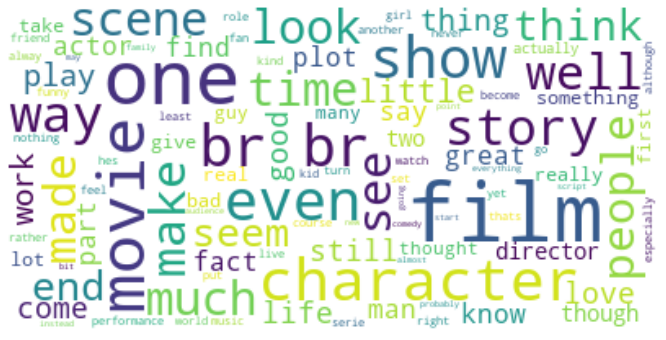

In [18]:
#  Word clouds
import matplotlib.pyplot as plt
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = " ".join(review for review in a)
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
fig = plt.figure(figsize = (20, 6)) 
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [19]:
import gensim #Topic Modelling Technicque called LDA (Latent Dirichlet Allocation)
from gensim.utils import simple_preprocess
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations
data = df['clean_review']
data_words = list(sent_to_words(data))
print(data_words[:1][0][:30])

['one', 'reviewers', 'mentioned', 'watching', 'oz', 'episode', 'youll', 'hooked', 'right', 'exactly', 'happened', 'mebr', 'br', 'first', 'thing', 'struck', 'oz', 'brutality', 'unflinching', 'scenes', 'violence', 'set', 'right', 'word', 'go', 'trust', 'show', 'faint', 'hearted', 'timid']


In [20]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=50, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)
# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [21]:
# NLTK Stop words
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
#stop_words.extend(['crypto','even','early'])
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]
def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Kartik\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [22]:

import spacy
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)




In [23]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)


In [24]:
# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
nlp = spacy.load("en_core_web_sm", disable=['parser', 'ner'])


In [25]:
# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ','ADV'])
#print(data_lemmatized[:1])

In [26]:
print(data_lemmatized[:1])

[['reviewer', 'right', 'exactly', 'mebr', 'first', 'thing', 'brutality', 'scene', 'violence', 'right', 'word', 'faint', 'hearted', 'timid', 'show', 'punch', 'drug', 'sex', 'violence', 'hardcore', 'classic', 'use', 'wordbr', 'nickname', 'oswald', 'security', 'state', 'penitentary', 'mainly', 'section', 'prison', 'cell', 'glass', 'front', 'inward', 'privacy', 'high', 'agenda', 'city', 'home', 'latino', 'irish', 'moreso', 'scuffle', 'death', 'dodgy', 'dealing', 'shady', 'agreement', 'never', 'far', 'main', 'appeal', 'show', 'due', 'fact', 'show', 'pretty', 'picture', 'mainstream', 'audience', 'charm', 'forget', 'romanceoz', 'first', 'episode', 'ever', 'nasty', 'surreal', 'ready', 'taste', 'high', 'level', 'graphic', 'violence', 'violence', 'injustice', 'guard', 'nickel', 'inmate', 'order', 'well', 'mannered', 'middle', 'class', 'inmate', 'prison', 'bitch', 'due', 'lack', 'street', 'skill', 'prison', 'experience', 'comfortable', 'uncomfortable', 'viewingthat', 'touch', 'dark', 'side']]


In [27]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words_bigrams)
# Create Corpus
texts = data_lemmatized
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
print(corpus[:1])

[[(1, 1), (3, 1), (11, 1), (14, 1), (16, 1), (17, 1), (18, 1), (19, 1), (25, 1), (27, 1), (30, 2), (33, 1), (34, 1), (35, 1), (36, 1), (39, 1), (40, 1), (41, 1), (42, 2), (44, 1), (49, 1), (53, 1), (56, 1), (57, 1), (58, 2), (59, 1), (61, 1), (64, 1), (67, 1), (70, 1), (71, 1), (72, 1), (73, 1), (77, 1), (80, 1), (81, 1), (83, 1), (84, 1), (85, 1), (86, 1), (88, 1), (89, 1), (92, 1), (94, 1), (95, 3), (96, 1), (99, 1), (102, 2), (103, 1), (108, 1), (109, 1), (111, 1), (112, 1), (113, 3), (115, 1), (119, 1), (120, 1), (122, 1), (123, 1), (124, 1), (125, 1), (126, 1), (129, 1), (131, 1), (133, 4), (136, 1), (138, 1), (139, 1), (166, 1), (378, 1), (666, 1), (982, 1), (1314, 1), (1320, 1), (1479, 1), (1745, 1), (1945, 1), (2139, 1), (2287, 1), (2834, 1), (2938, 1), (5474, 1), (6475, 1), (7835, 1), (19996, 1), (44153, 2), (59685, 1)]]


In [28]:
# supporting function
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=dictionary,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [98]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics= 4, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=2,
                                           per_word_topics=True)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [99]:
from gensim.models import CoherenceModel
# Compute Coherence Score for topic 2
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Coherence Score:  0.30312043741551886


In [100]:
from pprint import pprint
# Print the Keyword in the 2 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.016*"documentary" + 0.011*"game" + 0.010*"reality" + 0.010*"soldier" + '
  '0.009*"news" + 0.008*"state" + 0.008*"student" + 0.008*"truth" + '
  '0.007*"space" + 0.006*"battle"'),
 (1,
  '0.016*"also" + 0.013*"old" + 0.013*"role" + 0.013*"show" + 0.012*"young" + '
  '0.010*"life" + 0.010*"year" + 0.009*"watch" + 0.009*"family" + 0.009*"fun"'),
 (2,
  '0.055*"film" + 0.015*"story" + 0.015*"character" + 0.012*"well" + '
  '0.008*"good" + 0.008*"time" + 0.007*"way" + 0.007*"much" + 0.007*"great" + '
  '0.007*"scene"'),
 (3,
  '0.093*"movie" + 0.023*"bad" + 0.020*"good" + 0.017*"really" + 0.014*"even" '
  '+ 0.013*"time" + 0.011*"thing" + 0.011*"well" + 0.010*"people" + '
  '0.009*"ever"')]


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [101]:
pip install pyLDAvis


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [102]:
import pyLDAvis.gensim_models

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [103]:
df['clean_review']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0        one reviewers mentioned watching 1 oz episode ...
1        wonderful little production br br filming tech...
2        thought wonderful way spend time hot summer we...
3        basically theres family little boy jake thinks...
4        petter matteis love time money visually stunni...
                               ...                        
49995    thought movie right good job wasnt creative or...
49996    bad plot bad dialogue bad acting idiotic direc...
49997    catholic taught parochial elementary schools n...
49998    im going disagree previous comment side maltin...
49999    one expects star trek movies high art fans exp...
Name: clean_review, Length: 45339, dtype: object

In [104]:

df['abc']=df['clean_review'].str.split()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [105]:
df['abc']

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0        [one, reviewers, mentioned, watching, 1, oz, e...
1        [wonderful, little, production, br, br, filmin...
2        [thought, wonderful, way, spend, time, hot, su...
3        [basically, theres, family, little, boy, jake,...
4        [petter, matteis, love, time, money, visually,...
                               ...                        
49995    [thought, movie, right, good, job, wasnt, crea...
49996    [bad, plot, bad, dialogue, bad, acting, idioti...
49997    [catholic, taught, parochial, elementary, scho...
49998    [im, going, disagree, previous, comment, side,...
49999    [one, expects, star, trek, movies, high, art, ...
Name: abc, Length: 45339, dtype: object

In [106]:
#create dictionary

dictionary = corpora.Dictionary(df['abc'])
#Total number of non-zeroes in the BOW matrix (sum of the number of unique words per document over the entire corpus).
print(dictionary.num_nnz)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


4314018


In [107]:
#create document term matrix
doc_term_matrix = [dictionary.doc2bow(doc) for doc in df['abc'] ]
print(len(doc_term_matrix))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


45339


In [108]:
lda = gensim.models.ldamodel.LdaModel
num_topics=4
%time ldamodel = lda(doc_term_matrix,num_topics=num_topics,id2word=dictionary,passes=2,minimum_probability=0)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Wall time: 1min 18s


In [109]:
ldamodel.print_topics(num_topics=num_topics)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.029*"movie" + 0.021*"br" + 0.011*"film" + 0.011*"like" + 0.010*"one" + 0.008*"good" + 0.007*"really" + 0.006*"bad" + 0.006*"even" + 0.006*"would"'),
 (1,
  '0.021*"film" + 0.019*"br" + 0.007*"one" + 0.006*"story" + 0.004*"life" + 0.004*"movie" + 0.004*"films" + 0.004*"would" + 0.003*"well" + 0.003*"also"'),
 (2,
  '0.010*"film" + 0.008*"br" + 0.007*"one" + 0.005*"films" + 0.004*"best" + 0.003*"comedy" + 0.003*"role" + 0.003*"version" + 0.003*"cast" + 0.003*"great"'),
 (3,
  '0.017*"br" + 0.007*"one" + 0.004*"also" + 0.004*"series" + 0.003*"man" + 0.003*"good" + 0.003*"show" + 0.003*"film" + 0.003*"get" + 0.003*"great"')]

In [110]:
lda_display = pyLDAvis.gensim_models.prepare(ldamodel, doc_term_matrix, dictionary, sort_topics=False, mds='mmds')
pyLDAvis.display(lda_display)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [111]:
# Assigns the topics to the documents in corpus
lda_corpus = ldamodel[doc_term_matrix]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [112]:
[doc for doc in lda_corpus]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[[(0, 0.28258905), (1, 0.44636187), (2, 0.0016589665), (3, 0.2693901)],
 [(0, 0.0031347778), (1, 0.7931356), (2, 0.0031303249), (3, 0.2005993)],
 [(0, 0.4923825), (1, 0.2873312), (2, 0.005531777), (3, 0.21475454)],
 [(0, 0.72333664), (1, 0.026428306), (2, 0.0039833235), (3, 0.24625173)],
 [(0, 0.067127995), (1, 0.61460876), (2, 0.017302968), (3, 0.3009603)],
 [(0, 0.41057515), (1, 0.4714891), (2, 0.11331692), (3, 0.0046188356)],
 [(0, 0.7731839), (1, 0.18898854), (2, 0.033779573), (3, 0.0040479833)],
 [(0, 0.8846595), (1, 0.10884782), (2, 0.003306833), (3, 0.0031858534)],
 [(0, 0.75431657), (1, 0.0646606), (2, 0.17698632), (3, 0.004036432)],
 [(0, 0.8499605), (1, 0.12387661), (2, 0.012860555), (3, 0.013302332)],
 [(0, 0.86321396), (1, 0.12691532), (2, 0.004878675), (3, 0.004992024)],
 [(0, 0.63516897), (1, 0.0030768816), (2, 0.04206462), (3, 0.3196895)],
 [(0, 0.8013035), (1, 0.05057861), (2, 0.001245499), (3, 0.1468724)],
 [(0, 0.4331591), (1, 0.48576313), (2, 0.0048220963), (3, 0.076

In [113]:
from itertools import chain
scores = list(chain(*[[score for topic_id,score in topic] \
                      for topic in [doc for doc in lda_corpus]]))

threshold = sum(scores)/len(scores)
print(threshold)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0.25000000003632833


In [114]:
cluster1 = [j for i,j in zip(lda_corpus,df.index) if i[0][1] > threshold]
cluster2 = [j for i,j in zip(lda_corpus,df.index) if i[1][1] > threshold]
cluster3 = [j for i,j in zip(lda_corpus,df.index) if i[2][1] > threshold]

cluster4 = [j for i,j in zip(lda_corpus,df.index) if i[3][1] > threshold]


print(len(cluster1))
print(len(cluster2))
print(len(cluster3))
print(len(cluster4))


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


33866
18998
5246
10559


In [115]:
df

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,review,sentiment,clean_review,abc
0,One of the other reviewers has mentioned that ...,positive,one reviewers mentioned watching 1 oz episode ...,"[one, reviewers, mentioned, watching, 1, oz, e..."
1,A wonderful little production. <br /><br />The...,positive,wonderful little production br br filming tech...,"[wonderful, little, production, br, br, filmin..."
2,I thought this was a wonderful way to spend ti...,positive,thought wonderful way spend time hot summer we...,"[thought, wonderful, way, spend, time, hot, su..."
3,Basically there's a family where a little boy ...,negative,basically theres family little boy jake thinks...,"[basically, theres, family, little, boy, jake,..."
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,petter matteis love time money visually stunni...,"[petter, matteis, love, time, money, visually,..."
...,...,...,...,...
49995,I thought this movie did a down right good job...,positive,thought movie right good job wasnt creative or...,"[thought, movie, right, good, job, wasnt, crea..."
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",negative,bad plot bad dialogue bad acting idiotic direc...,"[bad, plot, bad, dialogue, bad, acting, idioti..."
49997,I am a Catholic taught in parochial elementary...,negative,catholic taught parochial elementary schools n...,"[catholic, taught, parochial, elementary, scho..."
49998,I'm going to have to disagree with the previou...,negative,im going disagree previous comment side maltin...,"[im, going, disagree, previous, comment, side,..."


In [116]:
df.loc[cluster1]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,review,sentiment,clean_review,abc
0,One of the other reviewers has mentioned that ...,positive,one reviewers mentioned watching 1 oz episode ...,"[one, reviewers, mentioned, watching, 1, oz, e..."
2,I thought this was a wonderful way to spend ti...,positive,thought wonderful way spend time hot summer we...,"[thought, wonderful, way, spend, time, hot, su..."
3,Basically there's a family where a little boy ...,negative,basically theres family little boy jake thinks...,"[basically, theres, family, little, boy, jake,..."
5,"Probably my all-time favorite movie, a story o...",positive,probably alltime favorite movie story selfless...,"[probably, alltime, favorite, movie, story, se..."
6,I sure would like to see a resurrection of a u...,positive,sure would like see resurrection dated seahunt...,"[sure, would, like, see, resurrection, dated, ..."
...,...,...,...,...
49991,"Les Visiteurs, the first movie about the medie...",negative,les visiteurs first movie medieval time travel...,"[les, visiteurs, first, movie, medieval, time,..."
49994,This is your typical junk comedy.<br /><br />T...,negative,typical junk comedybr br almost laughs genuine...,"[typical, junk, comedybr, br, almost, laughs, ..."
49995,I thought this movie did a down right good job...,positive,thought movie right good job wasnt creative or...,"[thought, movie, right, good, job, wasnt, crea..."
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",negative,bad plot bad dialogue bad acting idiotic direc...,"[bad, plot, bad, dialogue, bad, acting, idioti..."


In [117]:
df.loc[cluster2]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,review,sentiment,clean_review,abc
0,One of the other reviewers has mentioned that ...,positive,one reviewers mentioned watching 1 oz episode ...,"[one, reviewers, mentioned, watching, 1, oz, e..."
1,A wonderful little production. <br /><br />The...,positive,wonderful little production br br filming tech...,"[wonderful, little, production, br, br, filmin..."
2,I thought this was a wonderful way to spend ti...,positive,thought wonderful way spend time hot summer we...,"[thought, wonderful, way, spend, time, hot, su..."
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,petter matteis love time money visually stunni...,"[petter, matteis, love, time, money, visually,..."
5,"Probably my all-time favorite movie, a story o...",positive,probably alltime favorite movie story selfless...,"[probably, alltime, favorite, movie, story, se..."
...,...,...,...,...
49989,I got this one a few weeks ago and love it! It...,positive,got one weeks ago love modern light filled tru...,"[got, one, weeks, ago, love, modern, light, fi..."
49992,John Garfield plays a Marine who is blinded by...,positive,john garfield plays marine blinded grenade fig...,"[john, garfield, plays, marine, blinded, grena..."
49993,Robert Colomb has two full-time jobs. He's kno...,negative,robert colomb two fulltime jobs hes known thro...,"[robert, colomb, two, fulltime, jobs, hes, kno..."
49997,I am a Catholic taught in parochial elementary...,negative,catholic taught parochial elementary schools n...,"[catholic, taught, parochial, elementary, scho..."


In [118]:
df.loc[cluster3]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,review,sentiment,clean_review,abc
20,After the success of Die Hard and it's sequels...,positive,success die hard sequels surprise really 1990s...,"[success, die, hard, sequels, surprise, really..."
30,"Taut and organically gripping, Edward Dmytryk'...",positive,taut organically gripping edward dmytryks cros...,"[taut, organically, gripping, edward, dmytryks..."
45,"As a disclaimer, I've seen the movie 5-6 times...",positive,disclaimer ive seen movie 56 times last 15 yea...,"[disclaimer, ive, seen, movie, 56, times, last..."
50,Return to the 36th Chamber is one of those cla...,positive,return 36th chamber one classic kungfu movies ...,"[return, 36th, chamber, one, classic, kungfu, ..."
58,NO SPOILERS!!<br /><br />After Hitchcock's suc...,positive,spoilersbr br hitchcocks successful first amer...,"[spoilersbr, br, hitchcocks, successful, first..."
...,...,...,...,...
49888,"By 1955, five years after this one was release...",positive,1955 five years one released james stewart ant...,"[1955, five, years, one, released, james, stew..."
49896,"Despite the previous reviewer's screed, this i...",positive,despite previous reviewers screed well paced i...,"[despite, previous, reviewers, screed, well, p..."
49913,Why does this movie fall WELL below standards?...,negative,movie fall well standards ultimately answer li...,"[movie, fall, well, standards, ultimately, ans..."
49941,Why did the histories of Mary and Rhoda have t...,negative,histories mary rhoda dour divorced women indif...,"[histories, mary, rhoda, dour, divorced, women..."


In [119]:
df.loc[cluster4]

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,review,sentiment,clean_review,abc
0,One of the other reviewers has mentioned that ...,positive,one reviewers mentioned watching 1 oz episode ...,"[one, reviewers, mentioned, watching, 1, oz, e..."
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive,petter matteis love time money visually stunni...,"[petter, matteis, love, time, money, visually,..."
11,I saw this movie when I was about 12 when it c...,negative,saw movie 12 came recall scariest scene big bi...,"[saw, movie, 12, came, recall, scariest, scene..."
18,"I remember this film,it was the first film i h...",positive,remember filmit first film watched cinema pict...,"[remember, filmit, first, film, watched, cinem..."
25,The Karen Carpenter Story shows a little more ...,positive,karen carpenter story shows little singer kare...,"[karen, carpenter, story, shows, little, singe..."
...,...,...,...,...
49983,"I loved it, having been a fan of the original ...",positive,loved fan original series always wondered back...,"[loved, fan, original, series, always, wondere..."
49984,Hello it is I Derrick Cannon and I welcome you...,negative,hello derrick cannon welcome first ever cannon...,"[hello, derrick, cannon, welcome, first, ever,..."
49988,"When I first tuned in on this morning news, I ...",negative,first tuned morning news thought wow finally e...,"[first, tuned, morning, news, thought, wow, fi..."
49992,John Garfield plays a Marine who is blinded by...,positive,john garfield plays marine blinded grenade fig...,"[john, garfield, plays, marine, blinded, grena..."
